<a href="https://colab.research.google.com/github/manabtikadar/my_project/blob/main/YOLO_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
from seaborn import color_palette
import cv2

In [ ]:
_BATCH_NORM_DECAY = 0.9
_BATCH_NORM_EPSILON = 1e-05
_LEAKY_RELU = 0.1
_ANCHORS = [(10, 13), (16, 30), (33, 23),
            (30, 61), (62, 45), (59, 119),
            (116, 90), (156, 198), (373, 326)]
_MODEL_SIZE = (416, 416)

In [ ]:
def batch_norm(inputs, training, data_format):
  """Batch Normalization layer."""
  # Remove the training argument from initialization
  return tf.keras.layers.BatchNormalization(
      axis=1 if data_format == 'channels_first' else 3,
      momentum=_BATCH_NORM_DECAY,
      epsilon=_BATCH_NORM_EPSILON,
      scale=True,
      beta_initializer=tf.zeros_initializer(),
      gamma_initializer=tf.ones_initializer(),
      moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None,
      trainable=False
      )(inputs)  # Pass training during call to the layer

In [ ]:
def fixed_padding(inputs, kernel_size, data_format):
    pad_total = kernel_size - 1
    pad_beg = pad_total // 2
    pad_end = pad_total - pad_beg

    if data_format == 'channels_first':
        padded_inputs = tf.pad(inputs, [[0, 0], [0, 0],
                                        [pad_beg, pad_end],
                                        [pad_beg, pad_end]])
    else:
        padded_inputs = tf.pad(inputs, [[0, 0], [pad_beg, pad_end],
                                        [pad_beg, pad_end], [0, 0]])
    return padded_inputs

In [ ]:
def conv2D_fixed_padding(inputs, filters, kernel_size, data_format, strides=1):
    if strides > 1:
      inputs = fixed_padding(inputs, kernel_size, data_format)
    conv_output = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size,
                                         strides=strides, padding=('SAME' if strides==1 else 'VALID'),
                                         use_bias=False, data_format=data_format)(inputs)
    return conv_output

In [ ]:
def darknet53_residual_block(inputs, filters, training, data_format, strides=1):
  shortcut = inputs
  # convolution with 1*1
  inputs = conv2D_fixed_padding(inputs, filters=filters, kernel_size=1, data_format=data_format, strides=strides)
  inputs = batch_norm(inputs, training=training, data_format=data_format)
  inputs = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(inputs)
  # convolution with 3*3
  inputs = conv2D_fixed_padding(inputs, filters=2*filters, kernel_size=3, data_format=data_format, strides=strides)
  inputs = batch_norm(inputs, training=training, data_format=data_format)
  inputs = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(inputs)
  # residual block
  residual_outputs = tf.keras.layers.Add()([inputs, shortcut])
  return residual_outputs

In [ ]:
def darknet53(inputs, training, data_format):
  # conv1
  X = conv2D_fixed_padding(inputs, filters=32, kernel_size = 3, data_format=data_format, strides=1)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  # conv2
  X = conv2D_fixed_padding(X, filters=64, kernel_size = 3, data_format=data_format, strides=2)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  # residual_block1 * 1
  X = darknet53_residual_block(X, filters=32, training = training, data_format = data_format)
  # conv3
  X = conv2D_fixed_padding(X, filters=128, kernel_size = 3, data_format=data_format, strides=2)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  # residual_block2 * 2
  for _ in range(2):
    X = darknet53_residual_block(X, filters=64, training = training, data_format = data_format)
  # conv4
  X = conv2D_fixed_padding(X, filters=256, kernel_size = 3, data_format=data_format, strides=2)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  # residual_block3 * 8
  for _ in range(8):
    X = darknet53_residual_block(X, filters=128, training = training, data_format = data_format)
  route1 = X
  # conv5
  X = conv2D_fixed_padding(X, filters=512, kernel_size = 3, data_format=data_format, strides=2)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  #residual_block4 * 8
  for _ in range(8):
    X = darknet53_residual_block(X, filters=256, training = training, data_format = data_format)
  route2 = X
  # conv6
  X = conv2D_fixed_padding(X, filters=1024, kernel_size = 3, data_format=data_format, strides=2)
  X = batch_norm(X, training=training, data_format=data_format)
  X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
  # residual_block5 * 4
  for _ in range(4):
    X = darknet53_residual_block(X, filters=512, training = training, data_format = data_format)
  return route1,route2,X

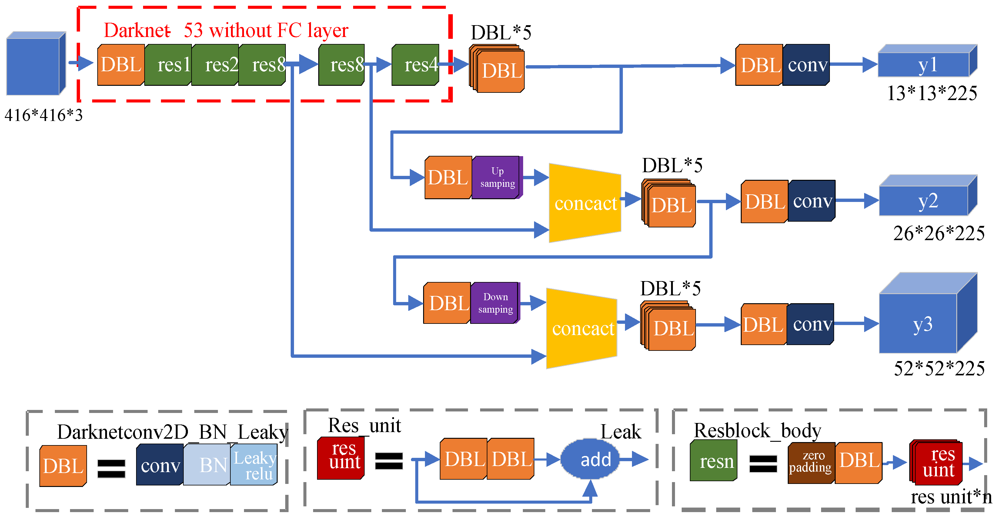

In [ ]:
# yolo_convolution_block : convolution operations layers used after DARKNET53
def yolo_convolution_block(inputs, filters, training, data_format):
    # conv1
    X = conv2D_fixed_padding(inputs, filters=filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
    # conv2
    X = conv2D_fixed_padding(inputs, filters=2*filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
    # conv3
    X = conv2D_fixed_padding(inputs, filters=filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
    # conv4
    X = conv2D_fixed_padding(inputs, filters=2*filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)
    # conv5
    X = conv2D_fixed_padding(inputs, filters=filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    X = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)

    route = X

    # last DBL layer
    X = conv2D_fixed_padding(inputs, filters=filters, kernel_size=1,
                                  data_format=data_format)
    X = batch_norm(inputs, training=training, data_format=data_format)
    outputs = tf.keras.layers.LeakyReLU(alpha=_LEAKY_RELU)(X)

    return route, outputs

In [ ]:
# yolo_layer : creates yolo final layer
def yolo_layers(inputs, n_classes, anchors, img_size, data_format):
  n_anchors = len(anchors)
  inputs = tf.keras.layers.Conv2D(filters = n_anchors * (5 + n_classes),
                                  kernel_size = 1,
                                  strides = (1,1),
                                  use_bias = True,
                                  data_format = data_format)(inputs)
  shape = inputs.get_shape().as_list()
  grid_shape = shape[2:4] if data_format == 'channels_first' else shape[1:3]
  if data_format == 'channels_first':
    inputs = tf.transpose(inputs, [0,2,3,1])
  inputs = tf.reshape(inputs, [-1, n_anchors * grid_shape[0] * grid_shape[1],
                                 5 + n_classes])
  strides = (img_size[0]//grid_shape[0],img_size[1]//grid_shape[1])
  box_centers, box_shapes, confidence, classes = tf.split(inputs, [2, 2, 1, n_classes], axis=-1)

  x = tf.range(grid_shape[0], dtype=tf.float32)
  y = tf.range(grid_shape[1], dtype=tf.float32)
  x_offset, y_offset = tf.meshgrid(x, y, indexing='ij')
  x_offset = tf.reshape(x_offset, (-1, 1))
  y_offset = tf.reshape(y_offset, (-1, 1))
  x_y_offset = tf.concat([x_offset, y_offset], axis=-1)
  x_y_offset = tf.tile(x_y_offset, [1, n_anchors])#If x_y_offset originally has shape (M * N, 2), after tiling it becomes (M * N, 2 * n_anchors)
  x_y_offset = tf.reshape(x_y_offset, [1, -1, 2])#(1, M * N * n_anchors, 2)
  box_centers = tf.nn.sigmoid(box_centers)
  box_centers = (box_centers + x_y_offset) * strides

  anchors = tf.tile(anchors, [grid_shape[0] * grid_shape[1], 1])
  box_shapes = tf.exp(box_shapes) * tf.cast(anchors, tf.float32)

  confidence = tf.nn.sigmoid(confidence)

  classes = tf.nn.sigmoid(classes)
  inputs = tf.concat([box_centers, box_shapes, confidence, classes], axis=-1)
  return inputs

In [ ]:
def upsample(inputs, out_shape, data_format):
  if data_format == 'channels_first':
    inputs = tf.transpose(inputs, [0,2,3,1])
    new_height = out_shape[3]
    new_width = out_shape[2]
  else:
    new_height = out_shape[2]
    new_width = out_shape[1]

  inputs = tf.image.resize(inputs, (new_height, new_width), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  if data_format == 'channels_first':
      inputs = tf.transpose(inputs, [0, 3, 1, 2])

  return inputs

In [ ]:
def build_boxes(inputs):
  center_x,center_y,width,height,confidence,classes = \
              tf.split(inputs, [1,1,1,1,1,-1], axis=-1)
  top_left_x = center_x - width/2
  top_left_y = center_y - height/2
  bottom_right_x = center_x + width/2
  bottom_right_y = center_y + height/2

  boxes = tf.concat([top_left_x,top_left_y,bottom_right_x,bottom_right_y,
                     confidence,classes], axis=-1)
  return boxes

In [ ]:
# non max suppression
def non_max_suppression(inputs, n_classes, max_output_size, iou_threshold, confidence_threshold):
  batch = tf.unstack(inputs)
  boxes_dicts = []
  for boxes in batch:
    boxes = tf.boolean_mask(boxes, boxes[:,4]>confidence_threshold)
    classes = tf.argmax(boxes[:,5:],axis=-1)
    classes = tf.expand_dims(tf.cast(classes, tf.float32), axis=-1)
    boxes = tf.concat([boxes[:,:5], classes], axis=-1)

    boxes_dict = dict()
    for cls in range(n_classes):
      mask = tf.equal(boxes[:,5],cls)
      mask_shape = mask.get_shape()
      if mask_shape.ndims != 0:
        class_boxes = tf.boolean_mask(boxes, mask)
        boxes_coords, boxes_conf_scores, _ = tf.split(class_boxes,
                                                      [4, 1, -1],
                                                      axis=-1)
        boxes_conf_scores = tf.reshape(boxes_conf_scores, [-1])
        indices = tf.image.non_max_suppression(boxes_coords,
                                               boxes_conf_scores,
                                               max_output_size,
                                               iou_threshold)
        class_boxes = tf.gather(class_boxes, indices)
        boxes_dict[cls] = class_boxes[:,:5]
    boxes_dicts.append(boxes_dict)
  return boxes_dicts

In [ ]:
class Yolo_v3:
  def __init__(self,n_classes,model_input_size,max_output_size,iou_threshold,confidence_threshold,data_format=None):
    with tf.compat.v1.variable_scope('yolo_v3_model'):
      if not data_format:
        if tf.test.is_built_with_cuda():
          data_format = 'channels_first'
        else:
          data_format = 'channels_last'
      self.n_classes = n_classes
      self.model_input_size = model_input_size
      self.max_output_size = max_output_size
      self.iou_threshold = iou_threshold
      self.confidence_threshold = confidence_threshold
      self.data_format = data_format

  def __call__(self,inputs,training):

   with tf.compat.v1.variable_scope('yolo_v3_model'):
      if self.data_format == 'channels_first':
         inputs = tf.transpose(inputs, [0, 3, 1, 2])
      # scale 1
      inputs = inputs/255
      route1, route2, inputs = darknet53(inputs, training=training,
                                                data_format=self.data_format)
      route,inputs= yolo_convolution_block(inputs, filters=512, training=training, data_format=self.data_format)
      detect1 = yolo_layers(inputs, self.n_classes, anchors=_ANCHORS[6:9], img_size=self.model_input_size, data_format=self.data_format)

      # scale 2
      inputs = conv2D_fixed_padding(route, filters=256, kernel_size=1,
                                            data_format=self.data_format)
      inputs = batch_norm(inputs, training=training,
                          data_format=self.data_format)
      inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
      upsample_size = route2.get_shape().as_list()
      inputs = upsample(inputs, out_shape=upsample_size,
                        data_format=self.data_format)
      axis = 1 if self.data_format == 'channels_first' else 3
      inputs = tf.concat([inputs, route2], axis=axis)
      route, inputs = yolo_convolution_block(inputs, filters=256, training=training,
                                            data_format=self.data_format)
      detect2 = yolo_layers(inputs, self.n_classes, anchors=_ANCHORS[3:6], img_size=self.model_input_size, data_format=self.data_format)

      # scale3
      inputs = conv2D_fixed_padding(route, filters=128, kernel_size=1,
                                            data_format=self.data_format)
      inputs = batch_norm(inputs, training=training,
                          data_format=self.data_format)
      inputs = tf.nn.leaky_relu(inputs, alpha=_LEAKY_RELU)
      upsample_size = route1.get_shape().as_list()
      inputs = upsample(inputs, out_shape=upsample_size,
                        data_format=self.data_format)
      inputs = tf.concat([inputs, route1], axis=axis)
      route, inputs = yolo_convolution_block(inputs, filters=128, training=training,
                                            data_format=self.data_format)
      detect3 = yolo_layers(inputs, self.n_classes, anchors=_ANCHORS[0:3], img_size=self.model_input_size, data_format=self.data_format)

      inputs = tf.concat([detect1, detect2, detect3], axis=1)

      inputs = build_boxes(inputs)

      boxes_dicts = non_max_suppression(
          inputs, n_classes=self.n_classes,
          max_output_size=self.max_output_size,
          iou_threshold=self.iou_threshold,
          confidence_threshold=self.confidence_threshold)

   return boxes_dicts

In [ ]:
# load images as a numpy array
def load_images(img_names, model_input_size):
  # img_names: a list of image_name
  imgs = []
  for img_name in img_names:
    img = Image.open(img_name)
    img = img.resize(size = model_input_size)
    img = np.array(img, dtype=np.float32)
    img = np.expand_dims(img, axis=0)
    imgs.append(img)

  imgs = np.concatenate(imgs)
  return imgs

In [ ]:
# load class_names as a list from file_name
def load_class_names(file_name):

  with open(file_name, 'r') as f:
      class_names = f.read().splitlines()
  return class_names

In [ ]:
def draw_boxes(img_names, boxes_dicts, class_names, model_size):
    """Draws detected boxes.

    Args:
        img_names: A list of input images names.
        boxes_dict: A class-to-boxes dictionary.
        class_names: A class names list.
        model_size: The input size of the model.

    Returns:
        None.
    """
    colors = ((np.array(color_palette("hls", 80)) * 255)).astype(np.uint8)
    for num, img_name, boxes_dict in zip(range(len(img_names)), img_names,
                                         boxes_dicts):
        img = Image.open(img_name)
        draw = ImageDraw.Draw(img)
        print(img.size)
        font = ImageFont.truetype(font='/content/drive/MyDrive/YOLO_input/futur.ttf',
                                  size=(img.size[0] + img.size[1]) // 100)
        resize_factor = \
            (img.size[0] / model_size[0], img.size[1] / model_size[1])
        for cls in range(len(class_names)):
            boxes = boxes_dict[cls]
            if np.size(boxes) != 0:
                color = colors[cls]
                for box in boxes:
                    xy, confidence = box[:4], box[4]
                    xy = [xy[i] * resize_factor[i % 2] for i in range(4)]
                    x0, y0 = xy[0], xy[1]
                    thickness = (img.size[0] + img.size[1]) // 200
                    for t in np.linspace(0, 1, thickness):
                        xy[0], xy[1] = xy[0] + t, xy[1] + t
                        xy[2], xy[3] = xy[2] - t, xy[3] - t
                        if ((xy[3] >= xy[1])and(xy[2]>=xy[0])):
                            draw.rectangle(xy, outline=tuple(color))
                    text = '{} {:.1f}%'.format(class_names[cls],
                                               confidence * 100)
                    text_bbox = draw.textbbox((0, 0), text=text, font=font)
                    text_width = abs(text_bbox[2] - text_bbox[0])
                    text_height = abs(text_bbox[3] - text_bbox[1])
                    draw.rectangle([x0, y0 - text_height, x0 + text_width, y0],fill=tuple(color))
                    draw.text((x0, y0 - text_height), text, fill='black',
                              font=font)

        display(img)

In [ ]:
def load_weights(variables, file_name):
    """Reshapes and loads official pretrained Yolo weights.

    Args:
        variables: A list of tf.Variable to be assigned.
        file_name: A name of a file containing weights.

    Returns:
        A list of assign operations.
    """
    with open(file_name, "rb") as f:
        # Skip first 5 values containing irrelevant info
        np.fromfile(f, dtype=np.int32, count=5)
        weights = np.fromfile(f, dtype=np.float32)

        assign_ops = []
        ptr = 0

        # Load weights for Darknet part.
        # Each convolution layer has batch normalization.
        for i in range(52):
            conv_var = variables[5 * i]
            gamma, beta, mean, variance = variables[5 * i + 1:5 * i + 5]
            batch_norm_vars = [beta, gamma, mean, variance]

            for var in batch_norm_vars:
                shape = var.shape.as_list()
                num_params = np.prod(shape)
                var_weights = weights[ptr:ptr + num_params].reshape(shape)
                ptr += num_params
                assign_ops.append(tf.compat.v1.assign(var, var_weights))

            shape = conv_var.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape(
                (shape[3], shape[2], shape[0], shape[1]))
            var_weights = np.transpose(var_weights, (2, 3, 1, 0))
            ptr += num_params
            assign_ops.append(tf.compat.v1.assign(conv_var, var_weights))

        # Loading weights for Yolo part.
        # 7th, 15th and 23rd convolution layer has biases and no batch norm.
        ranges = [range(0, 6), range(6, 13), range(13, 20)]
        unnormalized = [6, 13, 20]
        for j in range(3):
            for i in ranges[j]:
                current = 52 * 5 + 5 * i + j * 2
                conv_var = variables[current]
                gamma, beta, mean, variance =  \
                    variables[current + 1:current + 5]
                batch_norm_vars = [beta, gamma, mean, variance]

                for var in batch_norm_vars:
                    shape = var.shape.as_list()
                    num_params = np.prod(shape)
                    var_weights = weights[ptr:ptr + num_params].reshape(shape)
                    ptr += num_params
                    assign_ops.append(tf.compat.v1.assign(var, var_weights))

                shape = conv_var.shape.as_list()
                num_params = np.prod(shape)
                var_weights = weights[ptr:ptr + num_params].reshape(
                    (shape[3], shape[2], shape[0], shape[1]))
                var_weights = np.transpose(var_weights, (2, 3, 1, 0))
                ptr += num_params
                assign_ops.append(tf.compat.v1.assign(conv_var, var_weights))

            bias = variables[52 * 5 + unnormalized[j] * 5 + j * 2 + 1]
            shape = bias.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape(shape)
            ptr += num_params
            assign_ops.append(tf.compat.v1.assign(bias, var_weights))

            conv_var = variables[52 * 5 + unnormalized[j] * 5 + j * 2]
            shape = conv_var.shape.as_list()
            num_params = np.prod(shape)
            var_weights = weights[ptr:ptr + num_params].reshape(
                (shape[3], shape[2], shape[0], shape[1]))
            var_weights = np.transpose(var_weights, (2, 3, 1, 0))
            ptr += num_params
            assign_ops.append(tf.compat.v1.assign(conv_var, var_weights))

    return assign_ops

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


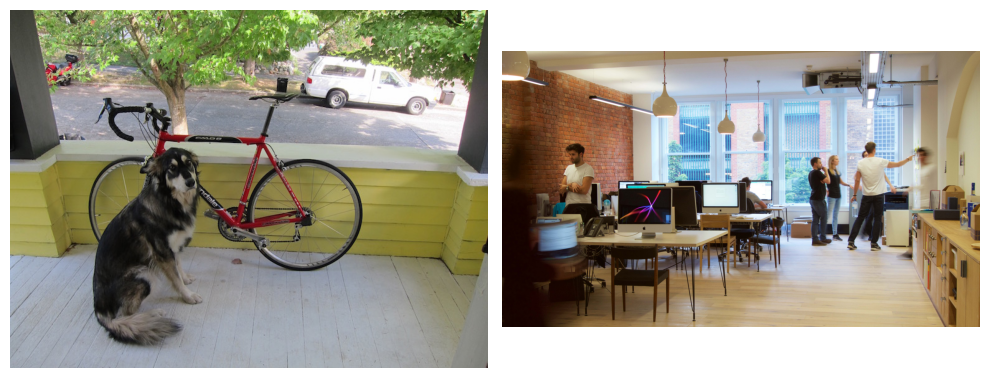

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
img_names = ['/content/drive/MyDrive/YOLO_input/dog.jpg','/content/drive/MyDrive/YOLO_input/office.jpg']


# Create a new figure to display images
fig, axes = plt.subplots(1, len(img_names), figsize=(10, 5))

# Loop through the image names and display them
for ax, img in zip(axes, img_names):
    img_obj = Image.open(img)
    ax.imshow(img_obj)
    ax.axis('off')  # Turn off axes for a cleaner look

plt.tight_layout()  # Adjust layout
plt.show()


Model output:
[{0: <tf.Tensor 'yolo_v3_model_8/strided_slice_4:0' shape=(None, 5) dtype=float32>, 1: <tf.Tensor 'yolo_v3_model_8/strided_slice_6:0' shape=(None, 5) dtype=float32>, 2: <tf.Tensor 'yolo_v3_model_8/strided_slice_8:0' shape=(None, 5) dtype=float32>, 3: <tf.Tensor 'yolo_v3_model_8/strided_slice_10:0' shape=(None, 5) dtype=float32>, 4: <tf.Tensor 'yolo_v3_model_8/strided_slice_12:0' shape=(None, 5) dtype=float32>, 5: <tf.Tensor 'yolo_v3_model_8/strided_slice_14:0' shape=(None, 5) dtype=float32>, 6: <tf.Tensor 'yolo_v3_model_8/strided_slice_16:0' shape=(None, 5) dtype=float32>, 7: <tf.Tensor 'yolo_v3_model_8/strided_slice_18:0' shape=(None, 5) dtype=float32>, 8: <tf.Tensor 'yolo_v3_model_8/strided_slice_20:0' shape=(None, 5) dtype=float32>, 9: <tf.Tensor 'yolo_v3_model_8/strided_slice_22:0' shape=(None, 5) dtype=float32>, 10: <tf.Tensor 'yolo_v3_model_8/strided_slice_24:0' shape=(None, 5) dtype=float32>, 11: <tf.Tensor 'yolo_v3_model_8/strided_slice_26:0' shape=(None, 5) dtype

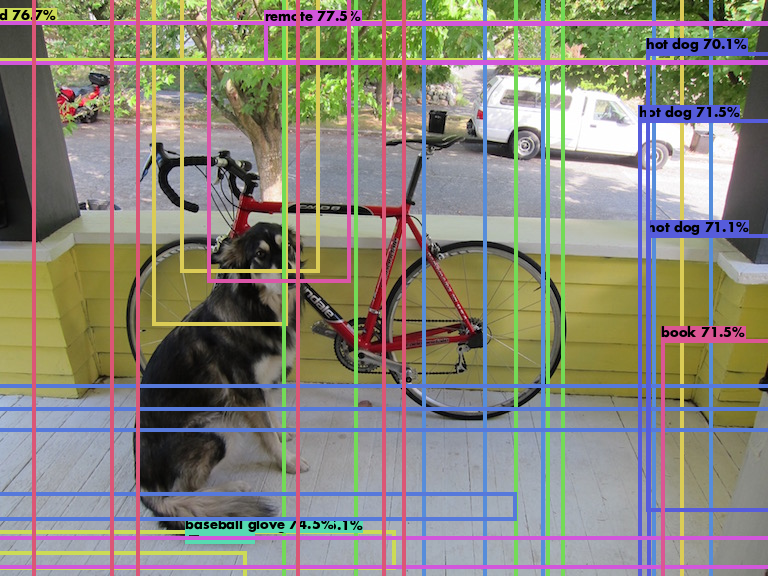

(4410, 2556)


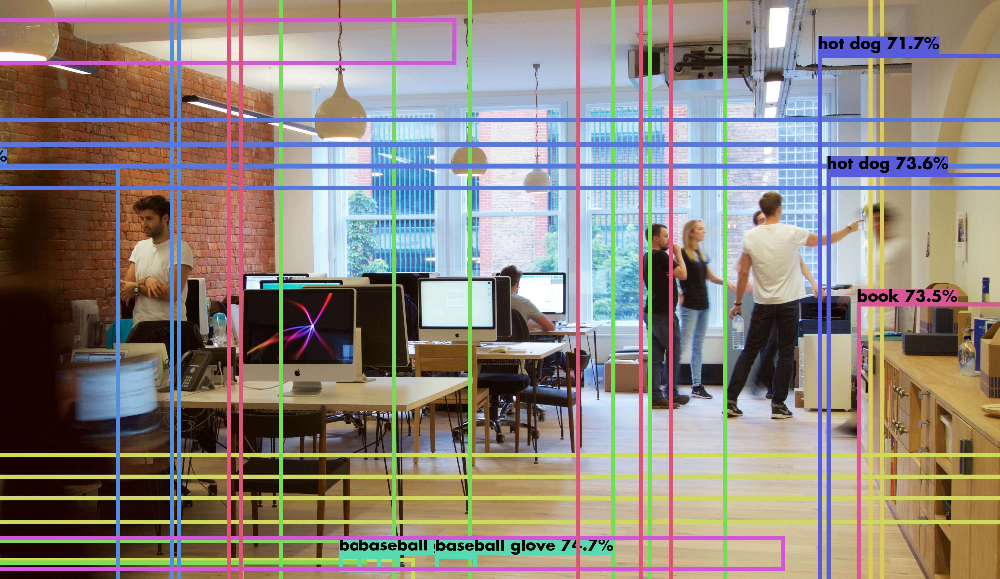

In [24]:
batch_size = len(img_names)
batch = load_images(img_names, model_input_size=_MODEL_SIZE)
class_names = load_class_names('/content/drive/MyDrive/YOLO_input/coco.names')
n_classes = len(class_names)
max_output_size = 3
iou_threshold = 0.7
confidence_threshold = 0.7
length = len(img_names)

model = Yolo_v3(n_classes=n_classes, model_input_size=_MODEL_SIZE,
                max_output_size=max_output_size,
                iou_threshold=iou_threshold,
                confidence_threshold=confidence_threshold,
                data_format='channels_last')
# Disable eager execution
tf.compat.v1.disable_eager_execution()
inputs = tf.compat.v1.placeholder(tf.float32, shape=(length, 416, 416, 3))

detections = model(inputs, training=False)
print("Model output:")
print(detections)
model_vars = tf.compat.v1.global_variables(scope='yolo_v3_model')
assign_ops = load_weights(model_vars, '/content/drive/MyDrive/YOLO_input/Yolo.weights/yolov3.weights')
with tf.compat.v1.Session() as sess:
    sess.run(tf.compat.v1.global_variables_initializer())
    sess.run(assign_ops)
    detection_result = sess.run(detections, feed_dict={inputs: batch})
    #print(detection_result)

draw_boxes(img_names, detection_result, class_names, _MODEL_SIZE)